In [1]:
%matplotlib inline
from riesling_plot import plot_3plane, plot_sense, plot_diff

# Tikhonov Regularization
This demo will demonstrate a SENSE recon with differing levels of Tikhonov regularization to the sensitivities. Start with a low SNR phantom and calculate the sample densities.

In [2]:
!rm tik*.h5

In [3]:
mat = 128
snr = 8

In [4]:
!riesling phantom --shepp_logan -m {mat} --snr {snr} tik
!riesling sdc tik.h5

Perform a root-sum-squares recon as a reference

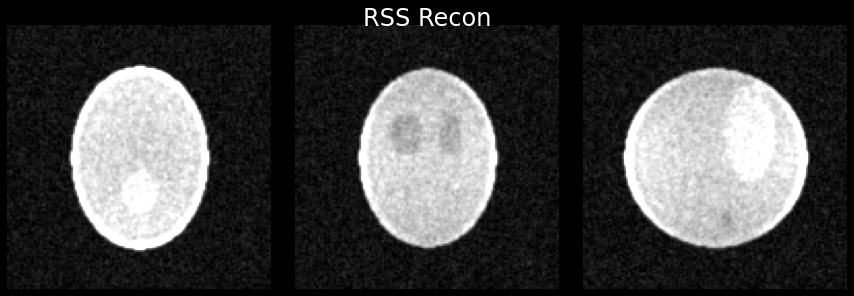

In [5]:
!riesling recon --rss --sdc=tik-sdc.h5 tik.h5
plot_3plane('tik-recon.h5', title='RSS Recon')

Now reconstruct sensitivities with increasing regularization. The sensitivities are normalized by the RSS image, so the reference point for the regularization is the background noise level. So first plot the RSS image with a narrow window to get an idea of that is.

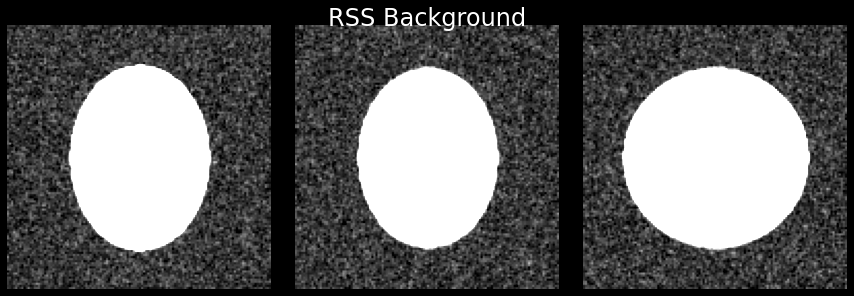

In [6]:
plot_3plane('tik-recon.h5', title='RSS Background', vmin=0, vmax=1000)

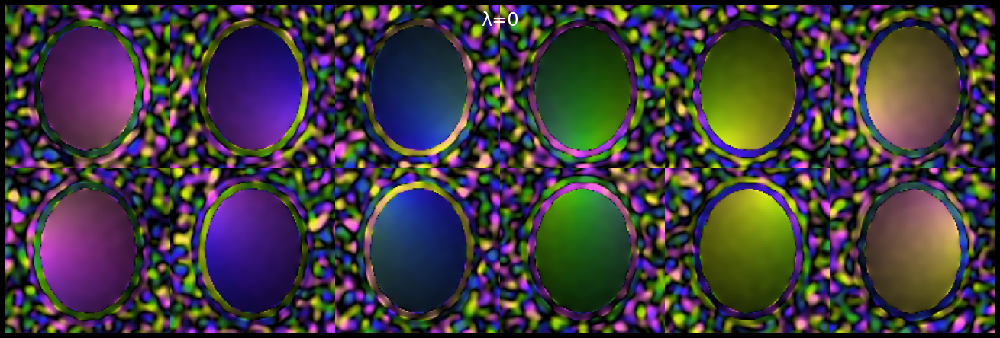

In [7]:
!riesling sense --sdc=tik-sdc.h5 tik.h5 --lambda=0 -o tik-l0
plot_sense('tik-l0-sense.h5', title='λ=0')

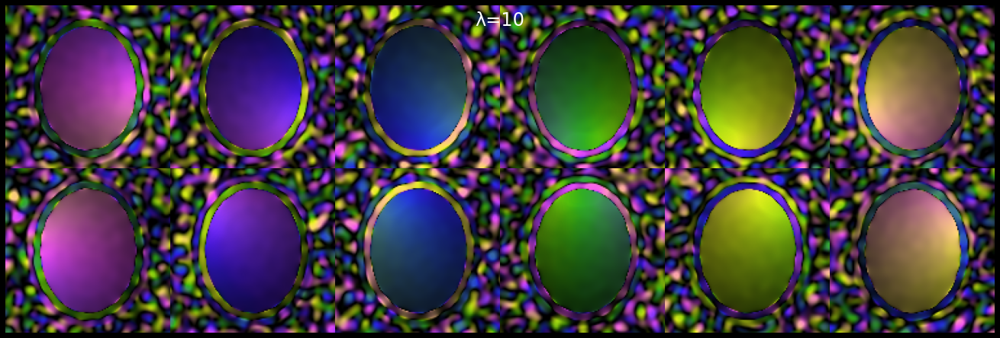

In [8]:
!riesling sense --sdc=tik-sdc.h5 tik.h5 --lambda=10 -o tik-l10
plot_sense('tik-l10-sense.h5', title='λ=10')

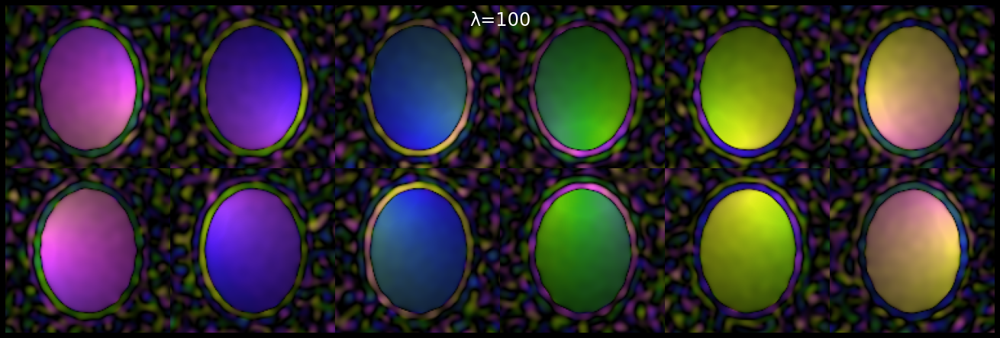

In [9]:
!riesling sense --sdc=tik-sdc.h5 tik.h5 --lambda=100 -o tik-l100
plot_sense('tik-l100-sense.h5', title='λ=100')

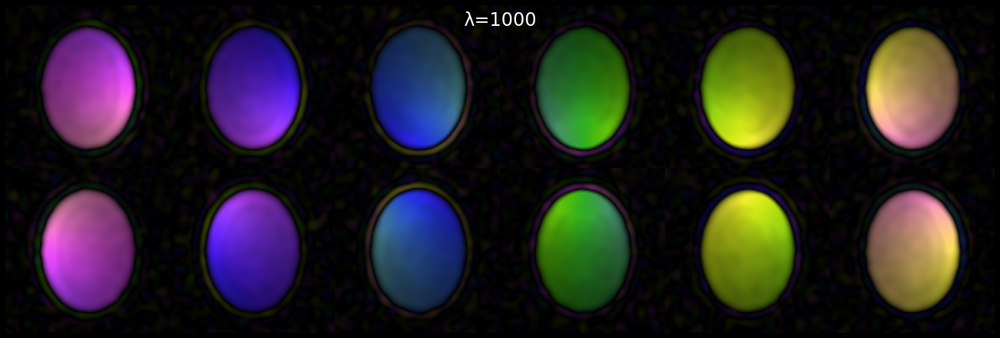

In [10]:
!riesling sense --sdc=tik-sdc.h5 tik.h5 --lambda=1000 -o tik-l1000
plot_sense('tik-l1000-sense.h5', title='λ=1000')

Now run the reconstructions with the different sensitivities and compare

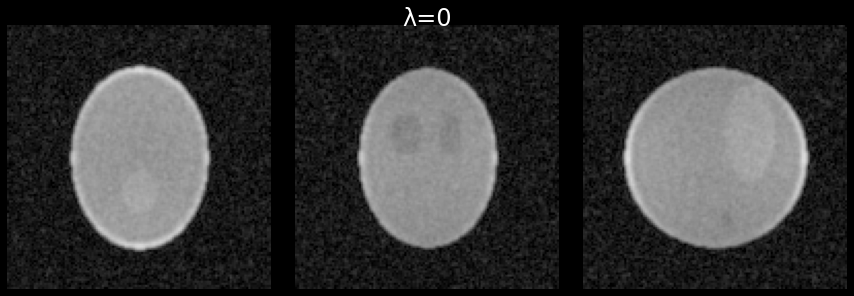

In [11]:
!riesling recon --sdc=tik-sdc.h5 --sense=tik-l0-sense.h5 tik.h5 -o tik-l0
plot_3plane('tik-l0-recon.h5', title='λ=0', vmin=0, vmax=75)

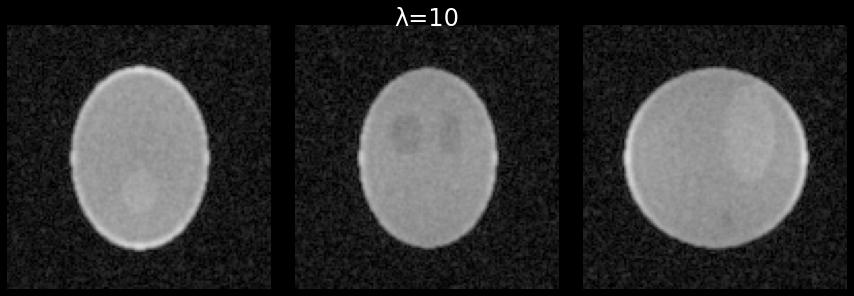

In [12]:
!riesling recon --sdc=tik-sdc.h5 --sense=tik-l10-sense.h5 tik.h5 -o tik-l10
plot_3plane('tik-l10-recon.h5', title='λ=10', vmin=0, vmax=75)

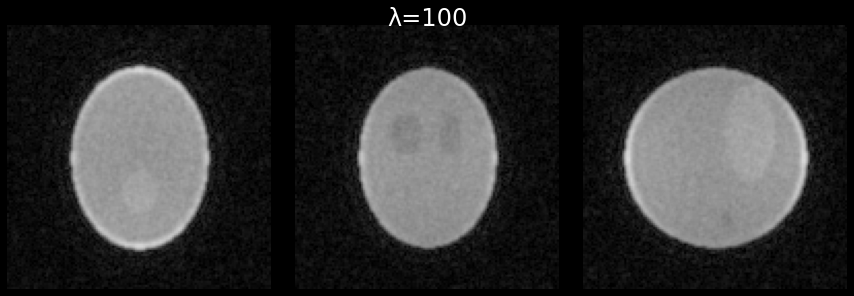

In [13]:
!riesling recon --sdc=tik-sdc.h5 --sense=tik-l100-sense.h5 tik.h5 -o tik-l100
plot_3plane('tik-l100-recon.h5', title='λ=100', vmin=0, vmax=75)

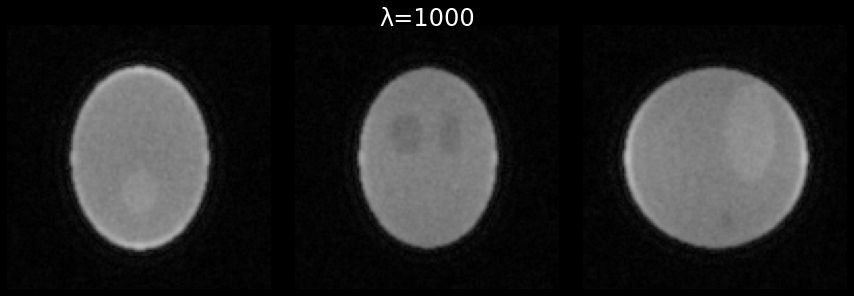

In [14]:
!riesling recon --sdc=tik-sdc.h5 --sense=tik-l1000-sense.h5 tik.h5 -o tik-l1000
plot_3plane('tik-l1000-recon.h5', title='λ=1000', vmin=0, vmax=75)

Now run some comparisons between the different recons. There is an intensity difference between RSS and SENSE reconstruction so use the λ=0 as reference.

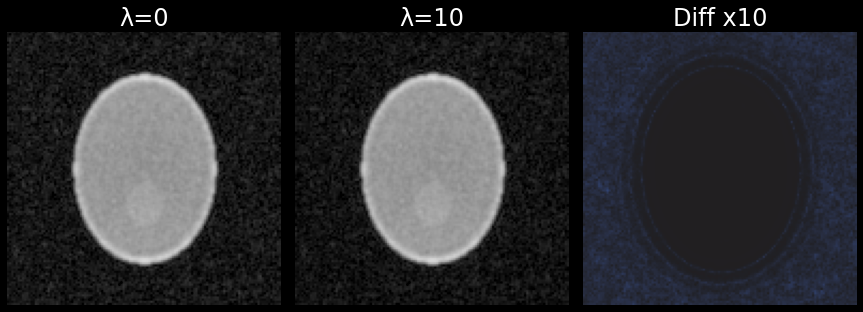

In [15]:
plot_diff('tik-l0-recon.h5', 'tik-l10-recon.h5', title1='λ=0', title2='λ=10', vmin=0, vmax=75, diffscale=10)

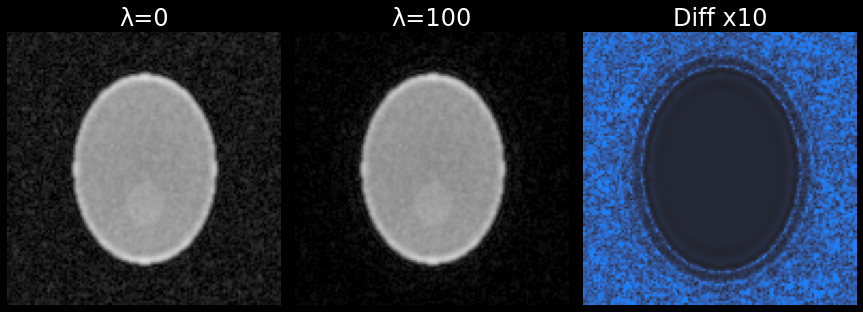

In [16]:
plot_diff('tik-l0-recon.h5', 'tik-l100-recon.h5', title1='λ=0', title2='λ=100', vmin=0, vmax=75, diffscale=10)

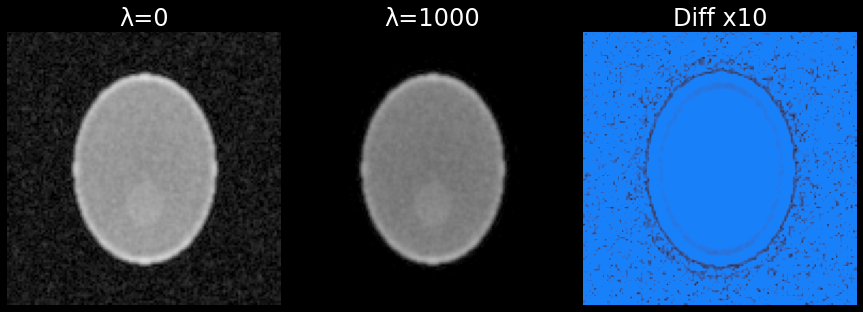

In [17]:
plot_diff('tik-l0-recon.h5', 'tik-l1000-recon.h5', title1='λ=0', title2='λ=1000', vmin=0, vmax=75, diffscale=10)

As the regularization is increased the background noise becomes progressively less and less. At the highest regularization level we seem some minor intensity differences within the phantom itself, suggesting that the correct λ value is somewhere between 100 and 1000 for this dataset.